In [1]:
import numpy as np
import scipy.stats as stats
import pandas as pd
import sklearn
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sb
import pickle as pkl
import random as rd
import matplotlib
matplotlib.rcParams['figure.dpi'] = 500
from helper import *
from sklearn.preprocessing import quantile_transform
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
from copy import deepcopy
from matplotlib.patches import Ellipse
from sklearn.model_selection import KFold

In [2]:
datadir = "../data/"
plotdir = "../plots/"

experimentParametersFn = "LLFS_Experiment_parameters_v7_excluded.csv"
dataFn = "peak_areas_lipid_pos_imputted.csv"
batchFn = "batch_info_lipid_pos.csv"


In [3]:
exp_params = pd.read_csv(datadir + experimentParametersFn,index_col=0)
data = pd.read_csv(datadir + dataFn,index_col=0)
batch = pd.read_csv(datadir + batchFn,index_col=0)

In [4]:
data = data[exp_params.index.values]
batch = batch.loc[exp_params.index.values,:]

In [5]:
data.to_csv(datadir + dataFn.replace(".csv","_rel.csv"))
batch.to_csv(datadir + batchFn.replace(".csv","_rel.csv"))

In [6]:
exp_params

,Unnamed: 0,File name lipids pos,File name lipids neg,File name metabolites pos,File name metabolites neg,Batch analysis,Batch list,Batch list #,Sample type,Metabolomics-Identifier,...,sex,age,collectdate,drawtime,receivedate,receivetime,interval_hrs,spouse_controls,Acq times for File name metabolites neg,found matching File name metabolites neg
peak area sample name,,,,,,,,,,,,,,,,,,,,,
Batch11_QC_01,6,BatchA_pL_QC_splash_01,BatchA_nL_QC_splash_01,BatchA_pP_QC_01,BatchA_nP_QC_01,A,Batch11,11,QC,QC_01,...,none,none,none,none,none,none,none,none,2021-04-12T09:23:00,True
Batch11_27754655_1,8,BatchA_pL_27754655_1,BatchA_nL_27754655_1,BatchA_pP_27754655_1,BatchA_nP_27754655_1,A,Batch11,11,Sample,27754655_1,...,2,98,16-Dec-08,8:45,17-Dec-08,12:23:00,28,No,2021-04-12T09:46:00,True
Batch11_29898244_1,9,BatchA_pL_29898244_1,BatchA_nL_29898244_1,BatchA_pP_29898244_1,BatchA_nP_29898244_1,A,Batch11,11,Sample,29898244_1,...,2,100,20-Nov-06,U,21-Nov-06,10:45:00,0,No,2021-04-12T10:09:00,True
Batch11_21170212_1,10,BatchA_pL_21170212_1,BatchA_nL_21170212_1,BatchA_pP_21170212_1,BatchA_nP_21170212_1,A,Batch11,11,Sample,21170212_1,...,2,61,28-Jan-08,8:15,29-Jan-08,10:45:00,26,No,2021-04-12T10:32:00,True
Batch11_22647044_1,11,BatchA_pL_22647044_1,BatchA_nL_22647044_1,BatchA_pP_22647044_1,BatchA_nP_22647044_1,A,Batch11,11,Sample,22647044_1,...,1,87,14-Jan-08,11:00,15-Jan-08,10:07:00,23,No,2021-04-12T10:55:00,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Batch1_14068365_1,2396,BatchV_pL_14068365_1,BatchV_nL_14068365_1,BatchV_pP_14068365_1,BatchV_nP_14068365_1,V,Batch1,1,Sample,14068365_1,...,2,101,28-Feb-07,8:00,7-Aug-07,11:39:00,3843,No,2021-06-19T19:53:00,True
Batch1_12245917_1,2397,BatchV_pL_12245917_1,BatchV_nL_12245917_1,BatchV_pP_12245917_1,BatchV_nP_12245917_1,V,Batch1,1,Sample,12245917_1,...,2,60,30-Oct-08,7:35,16-Dec-08,10:19:00,1131,No,2021-06-19T20:16:00,True
Batch1_19550962_1,2398,BatchV_pL_19550962_1,BatchV_nL_19550962_1,BatchV_pP_19550962_1,BatchV_nP_19550962_1,V,Batch1,1,Sample,19550962_1,...,1,59,21-May-07,8:35,27-Aug-07,15:14:00,2359,Yes,2021-06-19T20:39:00,True


In [7]:
data


,Batch11_QC_01,Batch11_27754655_1,Batch11_29898244_1,Batch11_21170212_1,Batch11_22647044_1,Batch11_21278619_1,Batch11_26725979_1,Batch11_27867373_1,Batch11_27138651_1,Batch11_28132752_1,...,Batch1_16486987_1,Batch1_QC_Splash_08,Batch1_13699137_1,Batch1_10604577_1,Batch1_13387105_1,Batch1_14068365_1,Batch1_12245917_1,Batch1_19550962_1,Batch1_15676422_1,Batch1_16475643_1
Molecule Name,,,,,,,,,,,,,,,,,,,,,
ACar 10:0,153696.0,1037918.0,389585.0,402505.0,247740.0,231746.0,640192.0,1770493.0,2083750.0,1925131.0,...,1586076.0,532520.0,886102.0,235579.0,1164372.0,219123.0,297906.0,578828.0,639094.0,1262947.0
ACar 10:1,142216.0,1344624.0,412702.0,394239.0,329204.0,173532.0,905126.0,942304.0,1882936.0,2593441.0,...,671104.0,485549.0,408058.0,194961.0,405102.0,180498.0,164083.0,421452.0,337840.0,372932.0
ACar 11:1,25735.0,162050.0,133600.0,56705.0,130580.0,30294.0,294237.0,217134.0,369725.0,387518.0,...,258260.0,89373.0,187263.0,74826.0,128471.0,59754.0,54044.0,110029.0,100577.0,63507.0
ACar 12:1,82602.0,512278.0,223314.0,148027.0,148549.0,130802.0,309241.0,655501.0,1430978.0,894139.0,...,498450.0,317245.0,357617.0,148924.0,519968.0,132198.0,157875.0,335621.0,178563.0,194331.0
ACar 13:1,22527.0,91328.0,39380.0,28728.0,95278.0,51325.0,393357.0,144810.0,198787.0,285121.0,...,105946.0,54526.0,61691.0,44160.0,59872.0,31156.0,26909.0,31676.0,42423.0,37371.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TG 54:5,56464852.0,350030592.0,189465696.0,277332448.0,182385968.0,44041936.0,283319616.0,146015088.0,291566496.0,295722368.0,...,71613368.0,126519376.0,70347888.0,62604752.0,69933192.0,127144728.0,44827152.0,74373432.0,89384688.0,100993280.0
TG 56:2,611522.0,7984010.0,4984585.0,13979908.0,9000211.0,389704.0,9021937.0,2713166.0,6779790.0,2739174.0,...,1342433.0,2034490.0,2485396.0,2397624.0,5658256.0,37069648.0,1496023.0,5007603.0,2075334.0,6766867.0
TG 56:5,11258501.0,84718712.0,52741536.0,63792612.0,32479534.0,10081631.0,70850688.0,34975836.0,65446148.0,71168360.0,...,22522350.0,25170812.0,18338098.0,18119338.0,41239184.0,38814260.0,14280647.0,27552572.0,23237980.0,37511884.0


In [8]:
batch

,batch,sample order,order
peak area sample name,,,
Batch11_QC_01,11,1,1
Batch11_27754655_1,11,2,2
Batch11_29898244_1,11,3,3
Batch11_21170212_1,11,4,4
Batch11_22647044_1,11,5,5
...,...,...,...
Batch1_14068365_1,1,2198,96
Batch1_12245917_1,1,2199,97
Batch1_19550962_1,1,2200,98


In [9]:

b = 0
oldB = -1
batch = batch.sort_values(by="sample order",ascending=True)
data = data[batch.index.values]
for index,row in batch.iterrows():
    if row["batch"] != oldB:
        b += 1
        oldB = row["batch"]
    batch.at[index,"batch"] = b
print(batch)        
        
data_mat = np.log2(data.to_numpy().transpose()) 
batch = batch.loc[data.columns.values,:].to_numpy()
qc_inds = [x for x in range(len(data_mat)) if "QC" in exp_params.at[data.columns.values[x],"Sample type"]]
samp_inds = [x for x in range(len(data_mat)) if x not in qc_inds]
samp_types = []
for x in range(len(data_mat)):
    if x in qc_inds:
        samp_types.append("orange")
    else:
        samp_types.append("blue")
print(data_mat.shape,len(qc_inds),len(samp_inds))


                       batch  sample order  order
peak area sample name                            
Batch11_QC_01              1             1      1
Batch11_27754655_1         1             2      2
Batch11_29898244_1         1             3      3
Batch11_21170212_1         1             4      4
Batch11_22647044_1         1             5      5
...                      ...           ...    ...
Batch1_14068365_1         22          2198     96
Batch1_12245917_1         22          2199     97
Batch1_19550962_1         22          2200     98
Batch1_15676422_1         22          2201     99
Batch1_16475643_1         22          2202    100

[2198 rows x 3 columns]
(2198, 192) 197 2001


In [10]:
def plot_pca(data,labels):
    #data[data < .1] = 2
    tmp = data
    pca = PCA(n_components=2)
    pca.fit(tmp)
    loads = pca.transform(tmp)
    var_explained = np.round(100*pca.explained_variance_ratio_,2)
    plt.figure()
    plt.xlabel("PC1 (" + str(var_explained[0]) + "%)")
    plt.ylabel("PC2 (" + str(var_explained[1]) + "%)")
    plt.scatter(loads[:,0],loads[:,1],c=labels,s=15,alpha=.5)
    return loads
    #plt.colorbar()
    
# def calculate_variance_ratio(data,qcInds,sampleInds):
#     varRatios = []
#     for x in data.transpose():
#         qcVar = np.var(x[qcInds])
#         sampVar = np.var(x[sampleInds])
#         if sampVar > 0:
#             varRatios.append(qcVar/sampVar)
#         else:
#             print(sampVar,qcVar)
#             varRatios.append(1)
#     return varRatios

def calculate_variance_ratio(data,qcInds,sampleInds):
    varRatios = []
    for x in data.transpose():
        qcVar = np.var(x[qcInds])
        sampVar = np.var(x[sampleInds])
        if qcVar > 0:
            varRatios.append(sampVar/qcVar)
        else:
            print(sampVar,qcVar)
            varRatios.append(sampVar/np.mean(x[qcInds]))
    return varRatios
    
def calculateVarianceExplainedByBatch(data,batches):
    covar = np.cov(data,rowvar=False)
    tmp = deepcopy(data)
    pca = PCA()
    pca.fit(tmp)
    loads = pca.transform(tmp)
    #pred = LinearRegression()
    pred = RandomForestRegressor()
    pred.fit(batches,loads)
    preds = pred.predict(batches)
    preds = pca.inverse_transform(preds)
    r2s = [r2_score(data[:,x],preds[:,x]) for x in range(data.shape[1])]
    batchVar = np.sum([r2s[x]*covar[x,x] for x in range(len(r2s))])
    totalVar = np.sum([covar[x,x] for x in range(len(r2s))])
    totalMean = np.sum(np.mean(data,axis=0))
    biologicalVar = totalVar - batchVar
    return batchVar/totalVar,biologicalVar,totalMean

def calculateCV(data):
    tmp = np.power(2,data)
    tmp = np.std(tmp,axis=0)/np.abs(np.mean(tmp,axis=0))
    return tmp


def colors(n): 
  ret = [] 
  r = int(np.random.random() * 256) 
  g = int(np.random.random() * 256) 
  b = int(np.random.random() * 256) 
  step = 256 / n 
  for i in range(n): 
    r += step 
    g += step 
    b += step 
    r = int(r) % 256 
    g = int(g) % 256 
    b = int(b) % 256 
    ret.append((r/256,g/256,b/256))  
  return ret 

def generateNormalizationPlot(peak_areas,runOrder,batches,met_names,qc_inds,samp_inds):
    n = int(peak_areas.shape[1]/3)
    fig,axes = plt.subplots(n,2,sharex=True,sharey=True,figsize=(10,n))
    ind = 0
    axes[0,0].set_title("QC samples")
    axes[0,1].set_title("research samples")
    for x in range(len(axes)):
        axes[x,0].scatter(runOrder[qc_inds],peak_areas[qc_inds,x],c=batches[qc_inds],s=1)
        axes[x,0].set_yticks([],[])
        axes[x,0].set_ylabel(met_names[x],fontsize=6)
        
        axes[x,1].scatter(runOrder[samp_inds],peak_areas[samp_inds,x],c=batches[samp_inds],s=1)
        axes[x,1].set_yticks([],[])
        
    plt.tight_layout()

In [11]:
normalized_data_dict = {}

In [12]:
normalized_data_dict["Unnormalized"] = data_mat


In [13]:
#combat

tmp = combat(pd.DataFrame(data_mat.transpose()),batch[:,0]).to_numpy().transpose()
normalized_data_dict["ComBat"] = tmp


found 22 batches
found 0 numerical covariates...
found 0 categorical variables:	
Standardizing Data across genes.
Fitting L/S model and finding priors
Finding parametric adjustments


Adjusting data


In [14]:
#combat+QC
tmp = np.zeros(data_mat.shape)
for b in list(set(batch[:,0])):
    try:
        inds = [x for x in range(len(batch)) if batch[x,0] == b]
        work_tmp = batch[inds,2]
        data_tmp = pd.DataFrame(np.power(2,data_mat[inds].transpose()))
        qc_inds_tmp = [x for x in range(len(inds)) if inds[x] in qc_inds]
        tmp[inds,:] = runQCNormalization(data_tmp,work_tmp,qc_inds_tmp).to_numpy().transpose()
    except:
        print(b,np.max(qc_inds_tmp),np.min(qc_inds_tmp),len(inds))
tmp = combat(pd.DataFrame(np.log2(tmp.transpose())),batch[:,0]).to_numpy().transpose()
normalized_data_dict["ComBat+QC"] = tmp



found 22 batches
found 0 numerical covariates...
found 0 categorical variables:	
Standardizing Data across genes.
Fitting L/S model and finding priors
Finding parametric adjustments


Adjusting data


In [15]:
#combat

tmp = np.log2(runQCNormalization(pd.DataFrame(np.power(2,data_mat.transpose())),batch[:,1],qc_inds).to_numpy().transpose())
normalized_data_dict["QC"] = tmp



In [16]:
#sum
tmp = []
for x in data_mat:
    tmp.append(100*x/np.sum(x))
tmp = np.array(tmp)
normalized_data_dict["L1"] = tmp

In [17]:
#l2
tmp = []
for x in data_mat:
    tmp.append(100*x/np.sqrt(np.sum(np.square(x))))
tmp = np.array(tmp)
normalized_data_dict["L2"] = tmp


In [18]:
#median
tmp = []
for x in data_mat:
    tmp.append(x/np.median(x))
tmp = np.array(tmp)
normalized_data_dict["Median"] = tmp


In [19]:
#quantile
tmp = quantile_transform(data_mat,output_distribution="normal")
normalized_data_dict["Quantile (normal)"] = tmp


In [20]:
#quantile
tmp = quantile_transform(data_mat,output_distribution="uniform")
normalized_data_dict["Quantile (uniform)"] = tmp



In [21]:
#eigenMS
tmp = pd.read_csv(datadir + dataFn.replace(".csv", "_rel_eigen_ms_normalized.csv"),index_col=0)
tmp = tmp[data.columns.values]
normalized_data_dict["EigenMS"] = tmp.to_numpy().transpose()


In [22]:
#WaveICA
tmp = pd.read_csv(datadir + dataFn.replace(".csv", "_rel_waveICA_normalized.csv"),index_col=0)
tmp = tmp[data.columns.values]
normalized_data_dict["WaveICA"] = tmp.to_numpy().transpose()



In [23]:
#qc run order regression
reg = LinearRegression(fit_intercept=True)
X = batch[qc_inds][:,[0,1]]
pca = PCA(n_components=2)
loads = pca.fit_transform(data_mat)
y = loads[qc_inds]
reg.fit(X,y)
X = batch[:,[0,1]]
preds = reg.predict(X)
preds = pca.inverse_transform(preds)
print(preds.shape)
tmp = data_mat - preds
normalized_data_dict["Linear Regression"] = tmp


(2198, 192)


In [24]:
#qc run order regression (SVR)
reg = SVR()
X = batch[qc_inds][:,[0,1]]
pca = PCA(n_components=2)
loads = pca.fit_transform(data_mat)
y = loads[qc_inds]
preds = np.zeros((data_mat.shape[0],y.shape[1]))
for pc in range(y.shape[1]):
    reg.fit(X,y[:,pc])
    tmp = batch[:,[0,1]]
    preds[:,pc] = reg.predict(tmp)
preds = pca.inverse_transform(preds)
print(preds.shape)
tmp = data_mat - preds
normalized_data_dict["SVR"] = tmp


(2198, 192)


(2198, 192)
(2198, 2)


([], [])

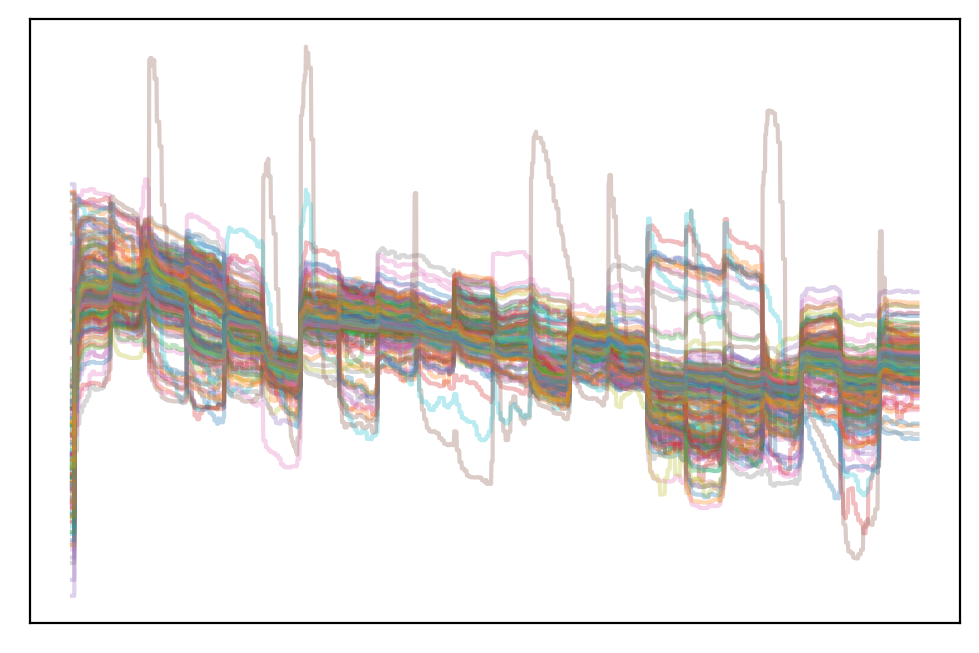

In [56]:
#qc run order regression (RF)
reg = RandomForestRegressor(n_jobs=10)
X = batch[qc_inds][:,[0,1]]
y = data_mat[qc_inds] - np.mean(data_mat[qc_inds],axis=0)
tmp = batch[:,[0,1]]
reg.fit(X,y)
preds = reg.predict(tmp)
tmp = data_mat - preds
normalized_data_dict["Random Forest"] = tmp
tmp = batch[:,[0,1]]
order = list(range(len(tmp)))
order.sort(key=lambda x:tmp[x][1])
print(preds.shape)
print(tmp.shape)
for x in range(preds.shape[1]):
    plt.plot(tmp[order,1],preds[order,x],alpha=0.3)
plt.xticks([],[])
plt.yticks([],[])

In [26]:
#PQN
tmp = 100*sklearn.preprocessing.normalize(data_mat,norm="l1")

#get median qc sample
reference = np.median(tmp[qc_inds],axis=0)

d_corr = []
for x in tmp:
    qs = []
    for f,r in zip(x,reference):
        qs.append(f/r)
    q = np.median(qs)
    d_corr.append([f/q for f in x])
    
tmp = np.array(d_corr)
normalized_data_dict["PQN"] = tmp

In [27]:
tmp = normalized_data_dict["Unnormalized"]
#batchVarExplained,bioVar,bioMean = calculateVarianceExplainedByBatch(tmp[samp_inds],batchInformationFormatted[samp_inds])
sampNorm = calculateCV(tmp[samp_inds])
qcNorm = calculateCV(tmp[qc_inds])

c:\users\ethan\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


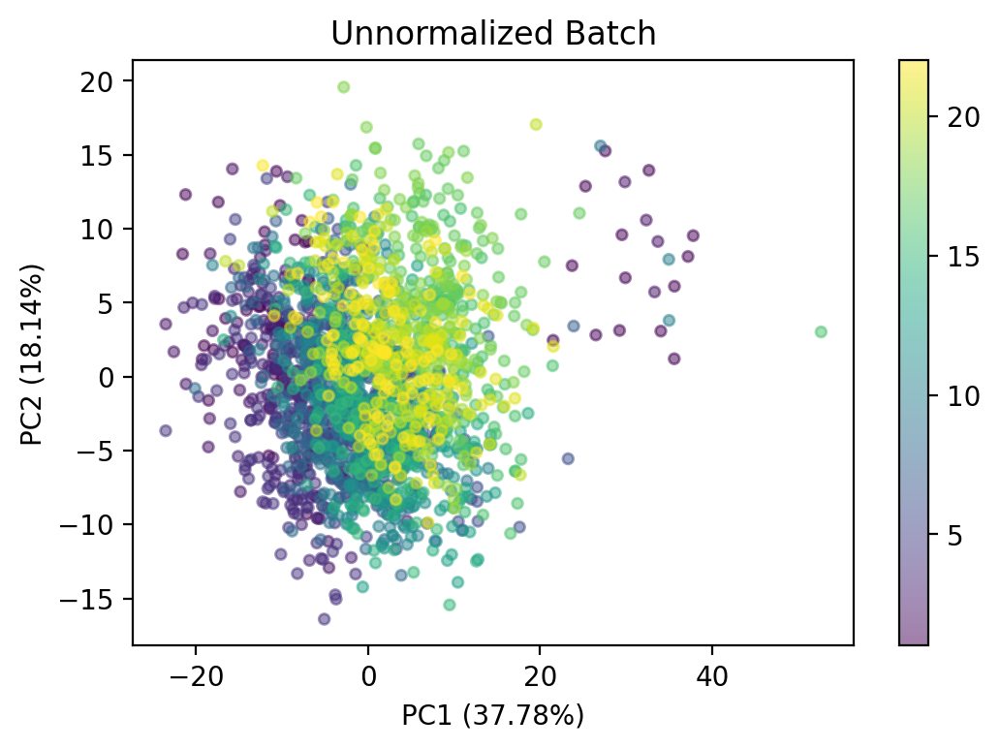

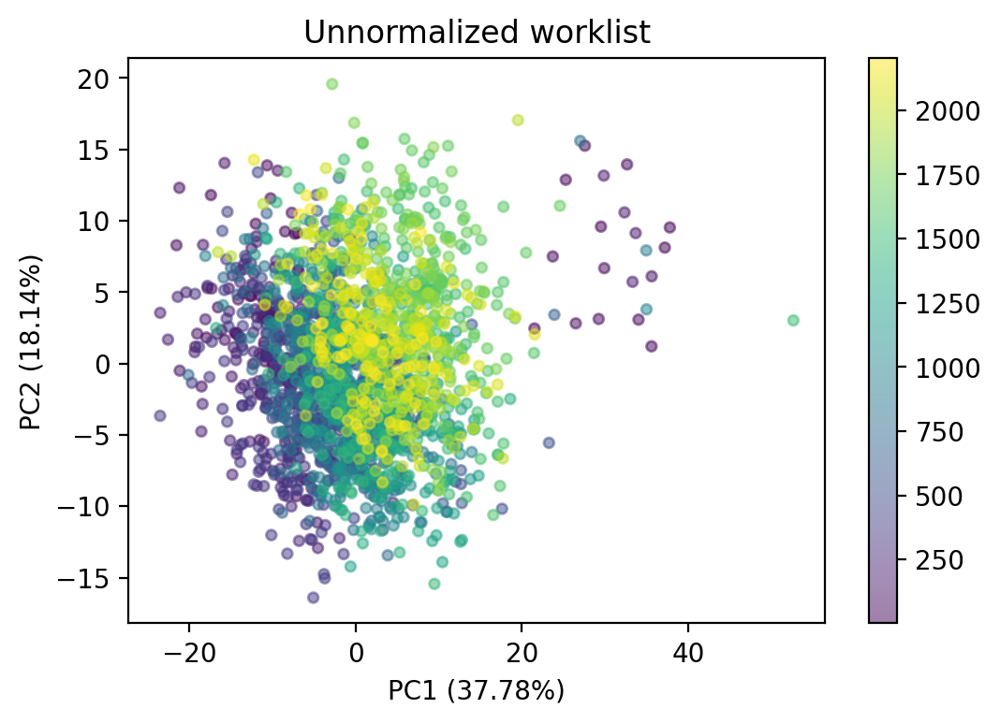

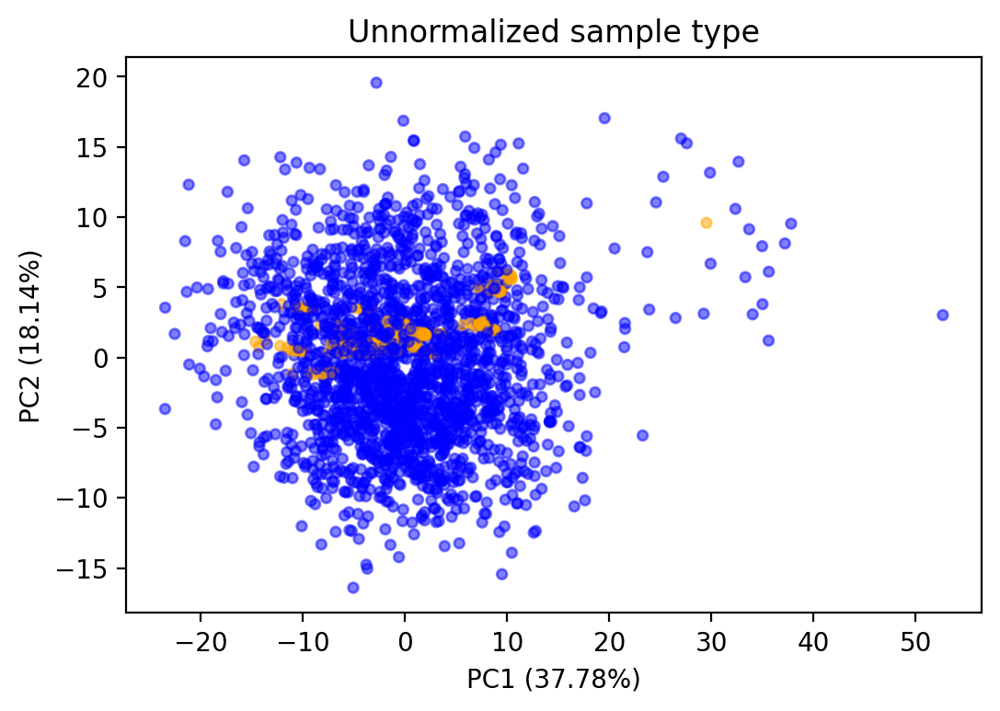

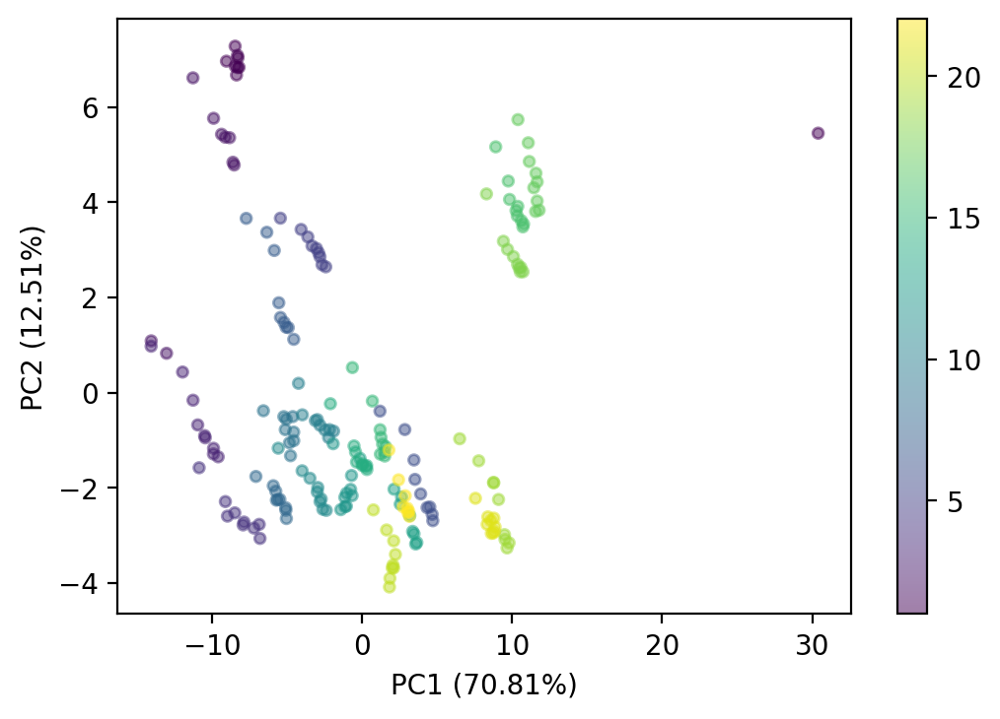

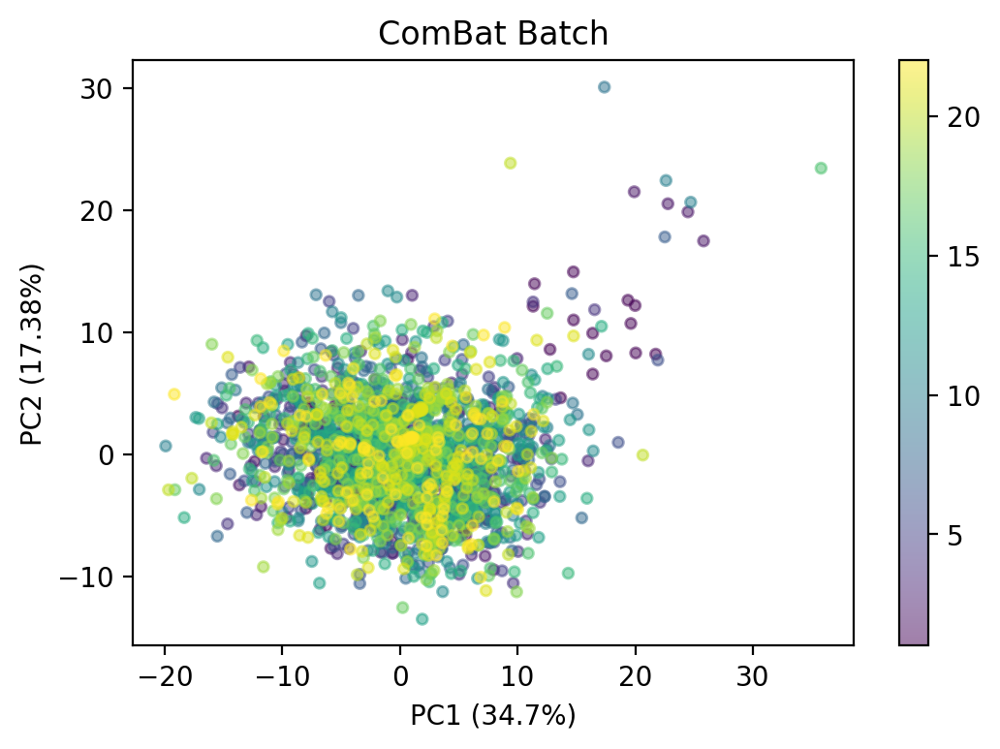

...

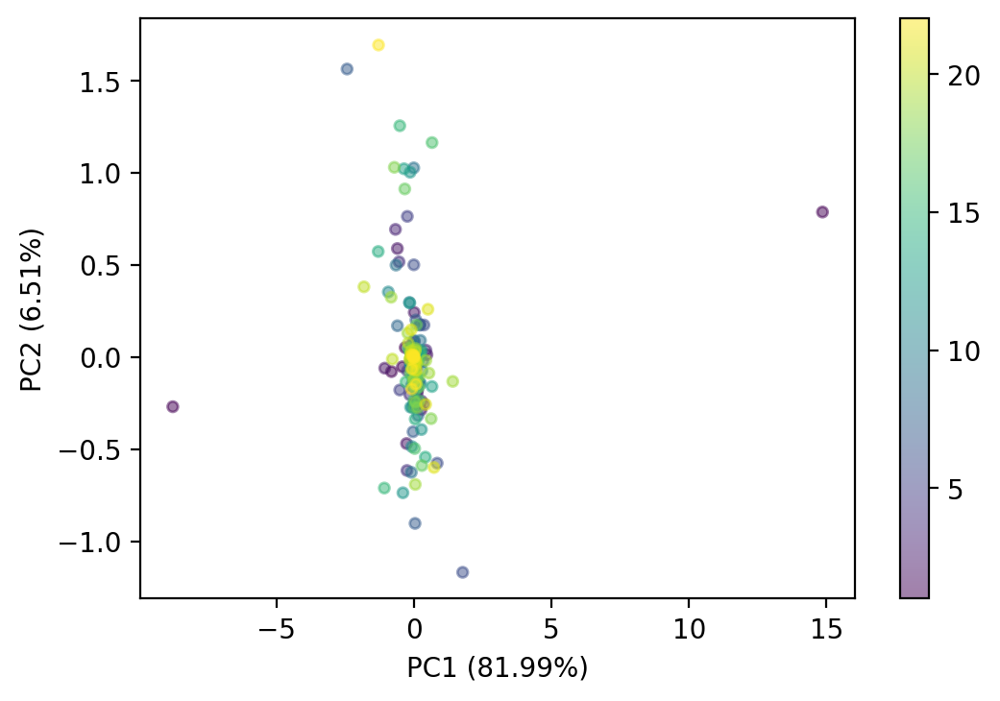

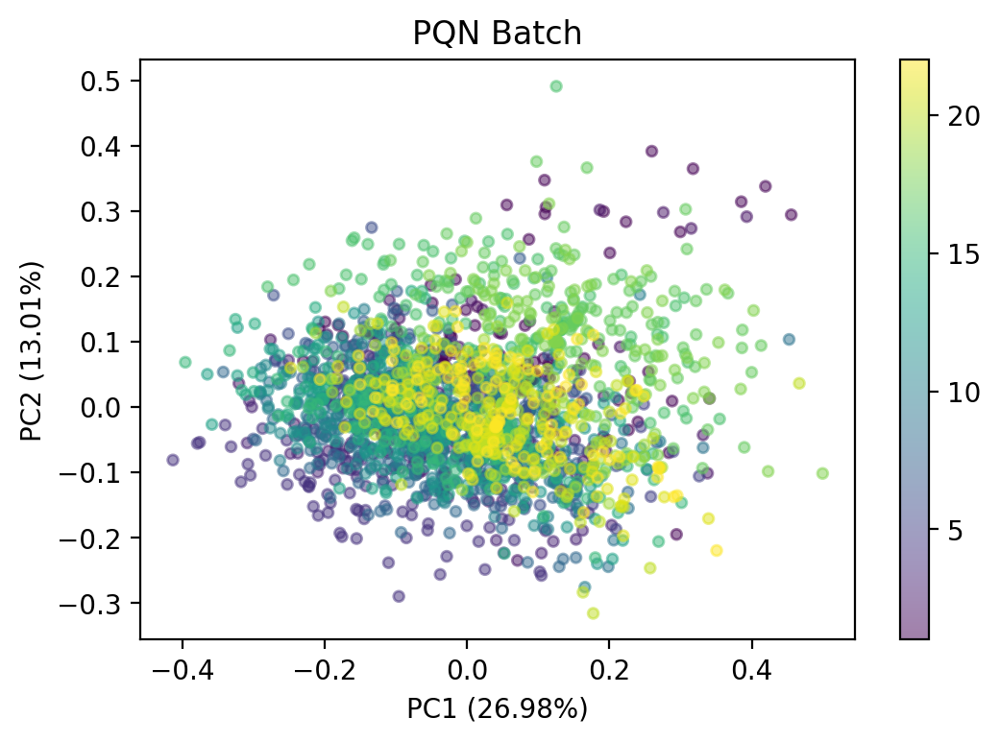

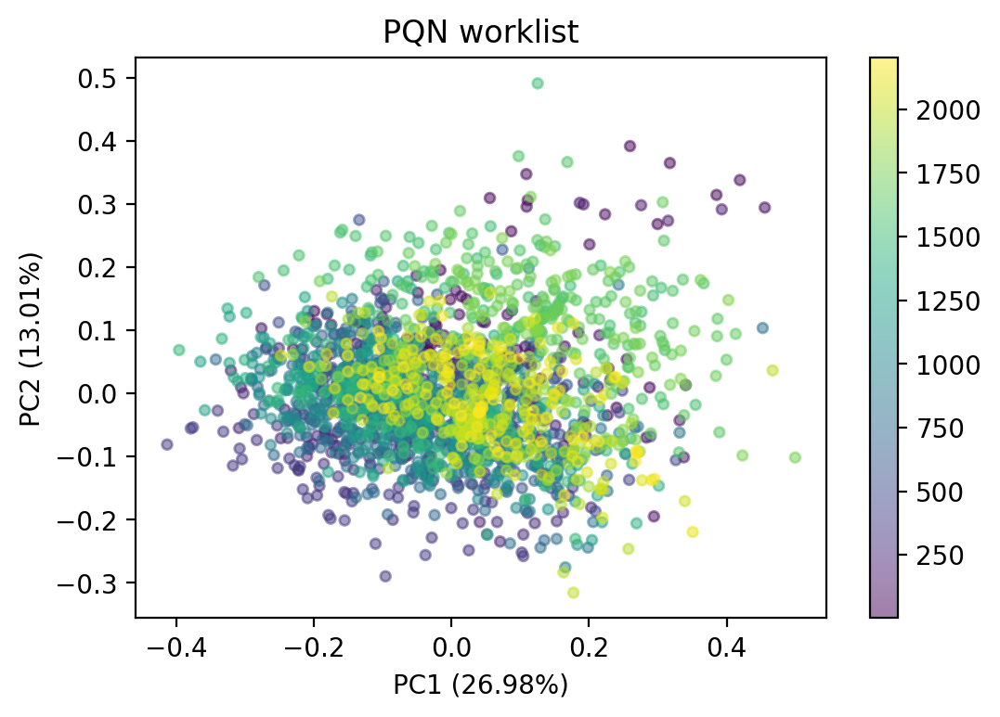

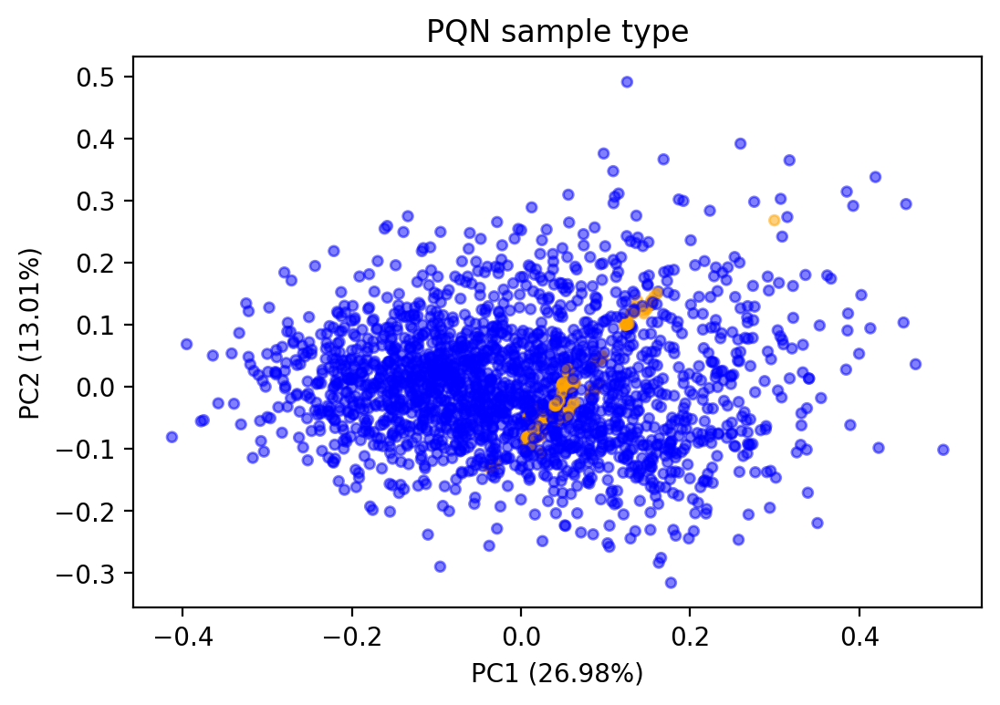

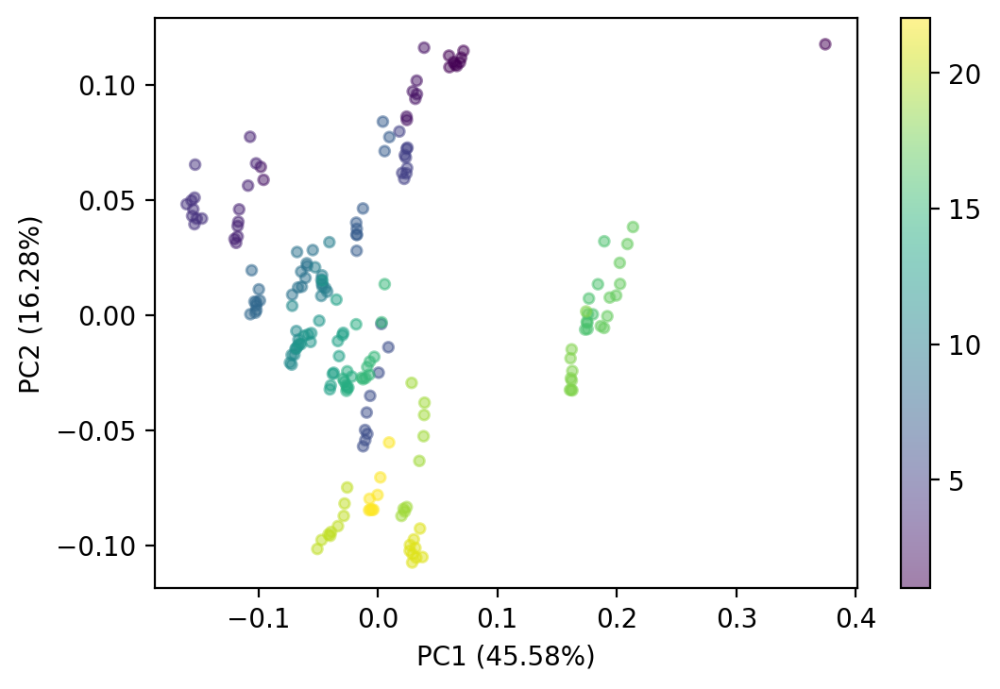

In [28]:
out_dict = {}
for method,tmp in normalized_data_dict.items():
    plot_pca(tmp,batch[:,0])
    plt.title(method + " Batch")
    plt.colorbar(ticks=[5,10,15,20])
    plt.savefig(plotdir + dataFn.replace(".csv",method + "_batch_pca.png"))
    plot_pca(tmp,batch[:,1])
    plt.title(method + " worklist")
    plt.colorbar()
    plt.savefig(plotdir + dataFn.replace(".csv",method + "_worklist_pca.png"))
    plot_pca(tmp,samp_types)
    plt.title(method + " sample type")
    plt.savefig(plotdir + dataFn.replace(".csv",method + "_sample_type_pca.png"))
    plot_pca(tmp[qc_inds],batch[qc_inds,0])
    plt.colorbar(ticks=[5,10,15,20])
    plt.savefig(plotdir + dataFn.replace(".csv",method + "_qc_pca.png"))
    
    
    
    
    cvQC = calculateCV(tmp[qc_inds])/qcNorm
    cvSamp = calculateCV(tmp[samp_inds])/sampNorm

    ratios = cvSamp/cvQC
    for ratio,met in zip(ratios,data.index.values):
        out_dict[len(out_dict)] = {"metabolite":met,"ratio":ratio,"method":method}
  

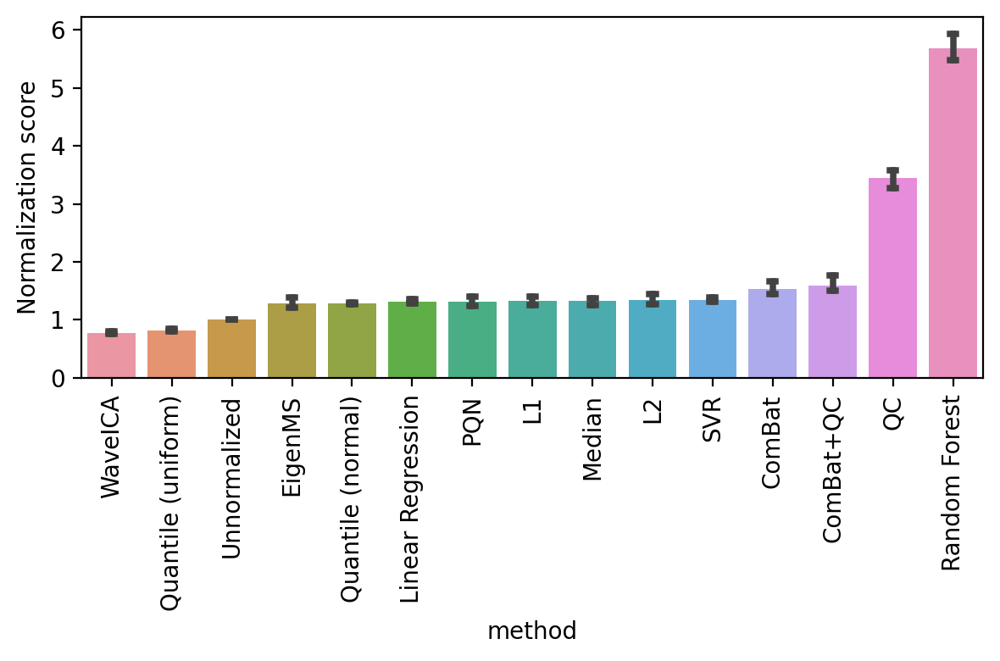

In [29]:
tmp = pd.DataFrame.from_dict(out_dict,orient="index")
order = list(set(tmp["method"].values))
order.sort(key=lambda x: np.median(tmp[tmp["method"] == x]["ratio"].values))
sb.barplot(data=tmp,x="method",y="ratio",order=order,estimator=np.median,capsize=.1)
plt.xticks(rotation=90)
plt.ylabel("Normalization score")
plt.tight_layout()
plt.savefig(plotdir + dataFn.replace(".csv","_bar_norm_result.png"))
bestMethod = order[-1]

In [30]:
tmp = normalized_data_dict[bestMethod]
pd.DataFrame(np.power(2,tmp).transpose(),index=data.index.values,columns=data.columns.values).to_csv(datadir + dataFn.replace(".csv","_" + bestMethod+"_normalized.csv"))

<Figure size 1200x800 with 0 Axes>

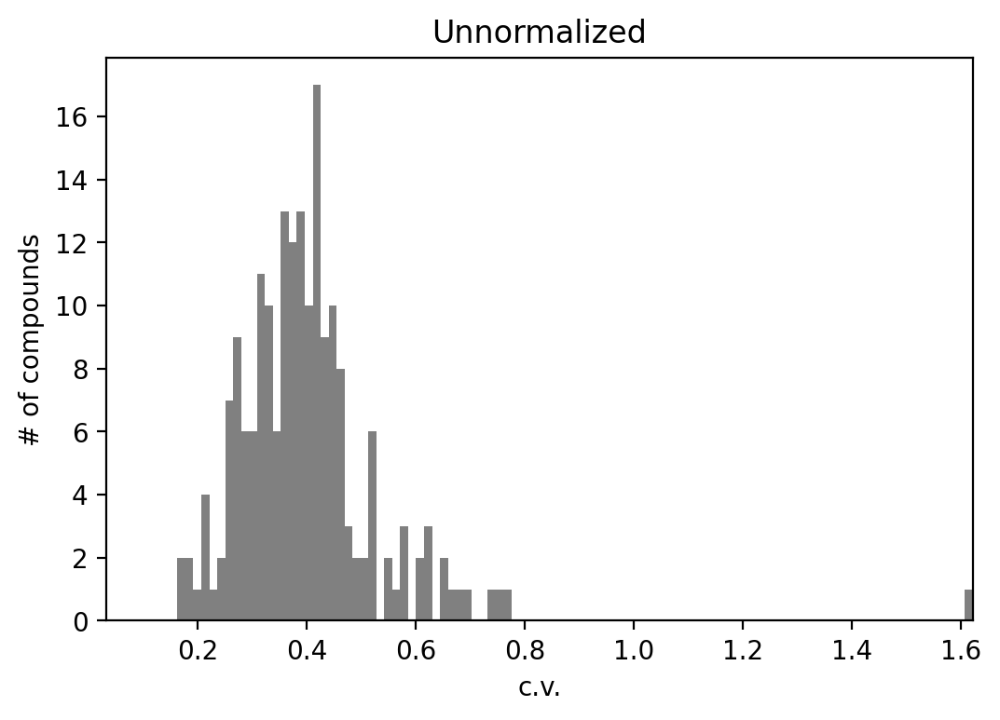

<Figure size 1200x800 with 0 Axes>

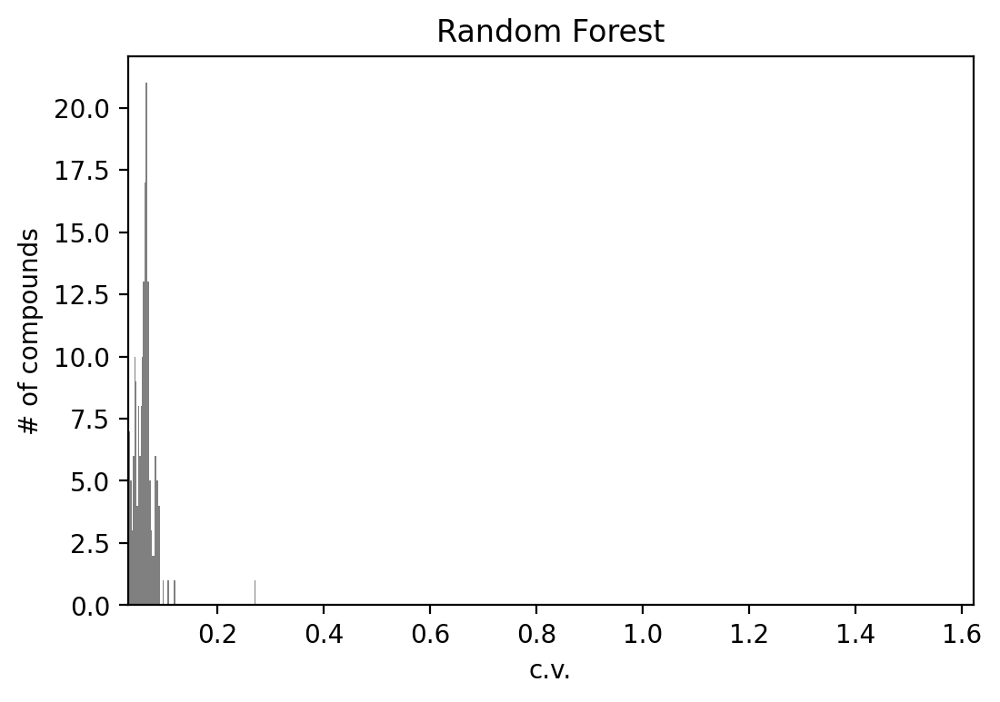

In [31]:
min_cv = np.min(list(calculateCV(normalized_data_dict[bestMethod][qc_inds])) + list(calculateCV(normalized_data_dict["Unnormalized"][qc_inds])))
max_cv = np.max(list(calculateCV(normalized_data_dict[bestMethod][qc_inds])) + list(calculateCV(normalized_data_dict["Unnormalized"][qc_inds])))

for method in ["Unnormalized",bestMethod]:
    plt.figure()
    tmp = normalized_data_dict[method]
    generateNormalizationPlot(tmp,batch[:,1],batch[:,0],data.index.values,qc_inds,[x for x in range(len(tmp)) if x not in qc_inds])
    plt.savefig(plotdir + dataFn.replace(".csv",method + "_batch_scatter.pdf"))
    plt.close()
    plt.figure()
    plt.hist(calculateCV(normalized_data_dict[method][qc_inds]),bins=100,color="grey")
    plt.title(method)
    plt.xlabel("c.v.")
    plt.ylabel("# of compounds")
    plt.xlim((min_cv,max_cv))
    plt.savefig(plotdir + dataFn.replace(".csv",method + "_cvHistogram.png"))

Batch11_QC_01
Batch11_21278619_1
Batch11_20709656_1
Batch11_29060415_1
Batch11_22691570_1
Batch11_27297829_1
Batch11_20662540_2
Batch11_27399857_1
Batch11_25454050_1
Batch11_26971663_1
Batch11_29077393_1
Batch11_28157972_1
Batch11_21804406_1
Batch11_25223405_1
Batch10_25104993_1
Batch10_32919011_2
Batch10_26947309_1
Batch10_34212358_1
Batch12_33642034_1
Batch12_24748006_2
Batch13_34453779_1
Batch15_33899759_2
Batch16_35611300_2
Batch16_32970196_1
Batch20_41353806_1
Batch22_47446448_1
Batch22_46133336_1
Batch22_48199285_2
Batch22_46956215_2
Batch22_47884515_1
Batch22_40678187_1
Batch22_40431967_1
Batch22_41186446_1
Batch22_47659959_1
Batch6_17120742_1
Batch6_13656962_1
Batch6_15014889_1
Batch6_12619631_1
Batch6_13529541_1
Batch6_14785613_1
Batch6_14906432_1
Batch6_13616834_1
Batch5_12691846_1
Batch5_12870630_1
Batch3_12593530_2
Batch3_10320679_1
Batch2_12266888_1
Batch2_15590749_1
Batch2_11569762_1


<Figure size 1200x800 with 0 Axes>

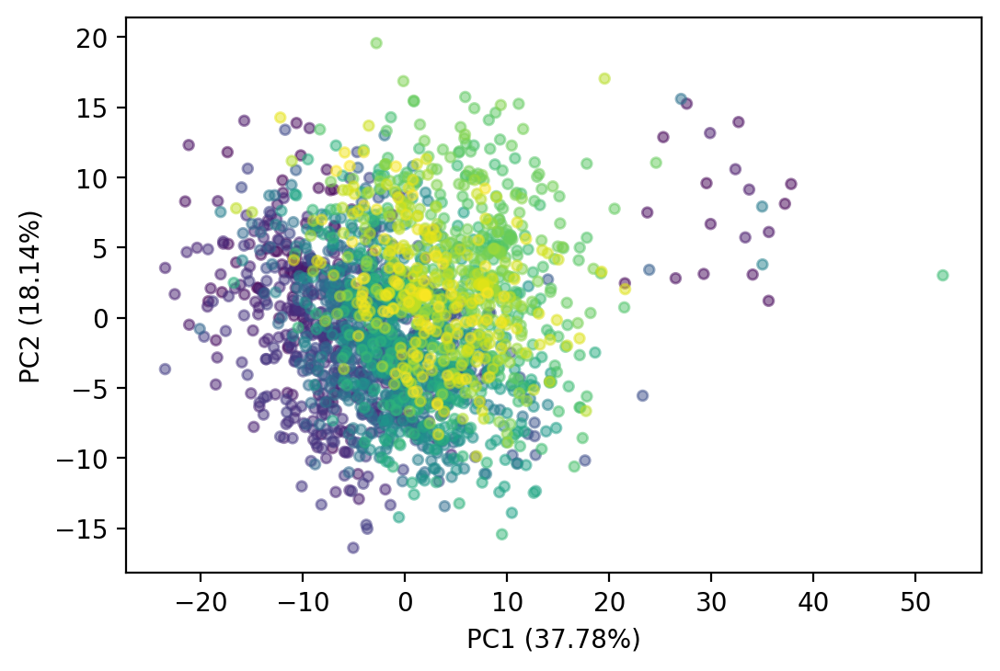

In [32]:
for method in ["Unnormalized"]:
    plt.figure()
    tmp = normalized_data_dict[method]
    loads = plot_pca(tmp,batch[:,1])
    for x in range(len(loads)):
        if loads[x][0] > 16:
            print(data.columns.values[x])